# Bài kiểm tra giữa kỳ

Trông mỗi trận đấu cờ vua, lịch sử các nước đi của các người chơi được lưu lại trong 1 phiếu. Các phiếu này được chụp lại như dữ liệu trong thư mục data. Để có thể số hoá tự động lưu trữ các dữ liệu này, chúng ta cần tách được thông tin trong các ô và nhận dạng chúng. Trong bài toán này, chúng ta cần thực hiện:
- Tách được các ô ghi các nước đi
- Đánh số được chúng theo chỉ số dòng và cột (để phân biệt được nước đi của người chơi nào và ở lượt đi nào)

Gợi ý: Để thực hiện yêu cầu đặt ra, người học nên
- Tiền xử lý ảnh để dữ liệu ở bước trước phù hợp với mục tiêu ở các bước tính toán sau: nhiễu, độ sắc nét, kích thước, màu sắc,...
- Phát hiện các đường ngang dọc hoặc các ô hình chữ nhật để tìm các ô ghi bước đi
- Dựa trên toạ độ của các điểm của các ô được phát hiện để tính chỉ số hàng và côt tương ứng cho các ô, từ đó cắt ra các ô mong muốn
  

In [2]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [3]:
img_paths = ['data/data/001_0.png', 'data/data/009_0.png', 'data/data/011_0.png', 'data/data/012_0.png']

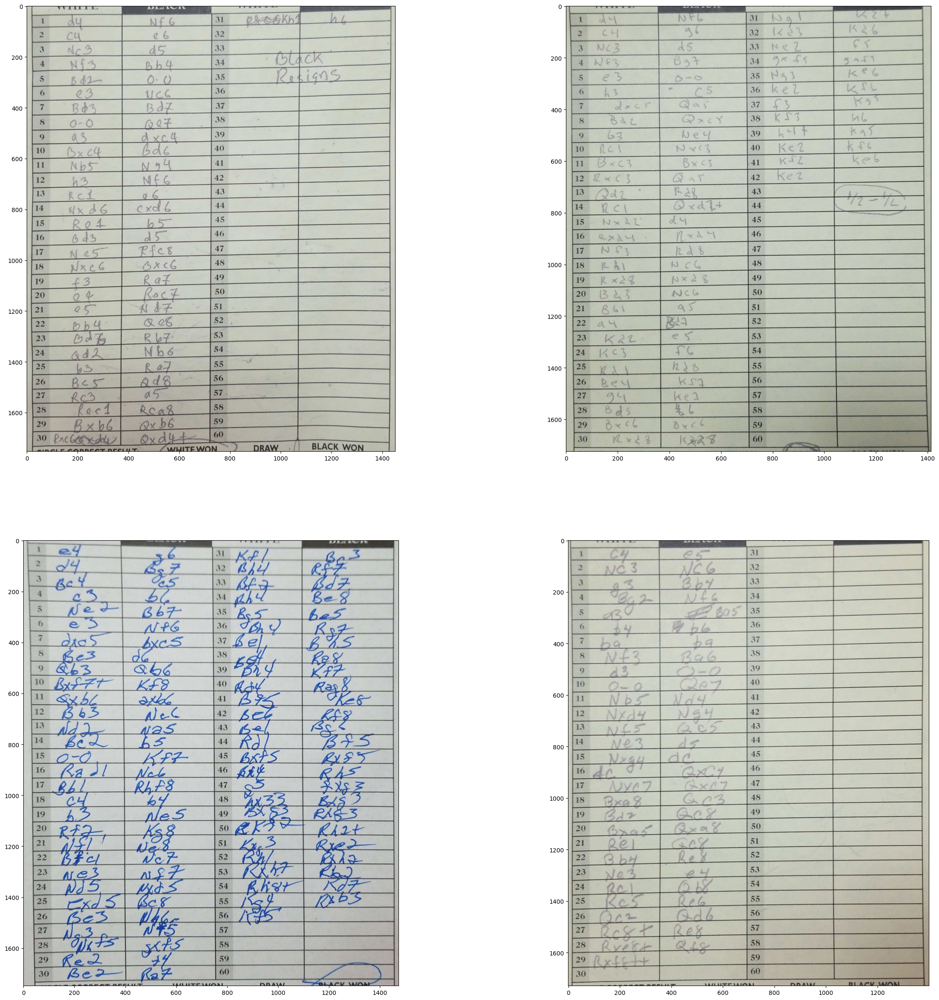

In [4]:
def showImages():
    fig, ax = plt.subplots(2, 2)
    fig.set_size_inches((30,30))
    
    for i in range(4):
        img = cv2.imread(img_paths[i])
        img =  cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
        (l, k) = divmod(i,2)
        ax[l, k].imshow(img)
    
    plt.show()

# Show all images in the test directory
showImages()

# 0. Pre-processing 
Noise reduction and/ edge enhancement/...

In [5]:
# Read image from a file
def readImage(image_path):
    # doc anh
    img_color = cv2.imread(image_path)
    if img_color is None:
        raise ValueError("Image not found or cannot be loaded.")
    
    # chuyen anh ve anh xam
    img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
    
    return img_color, img_gray    

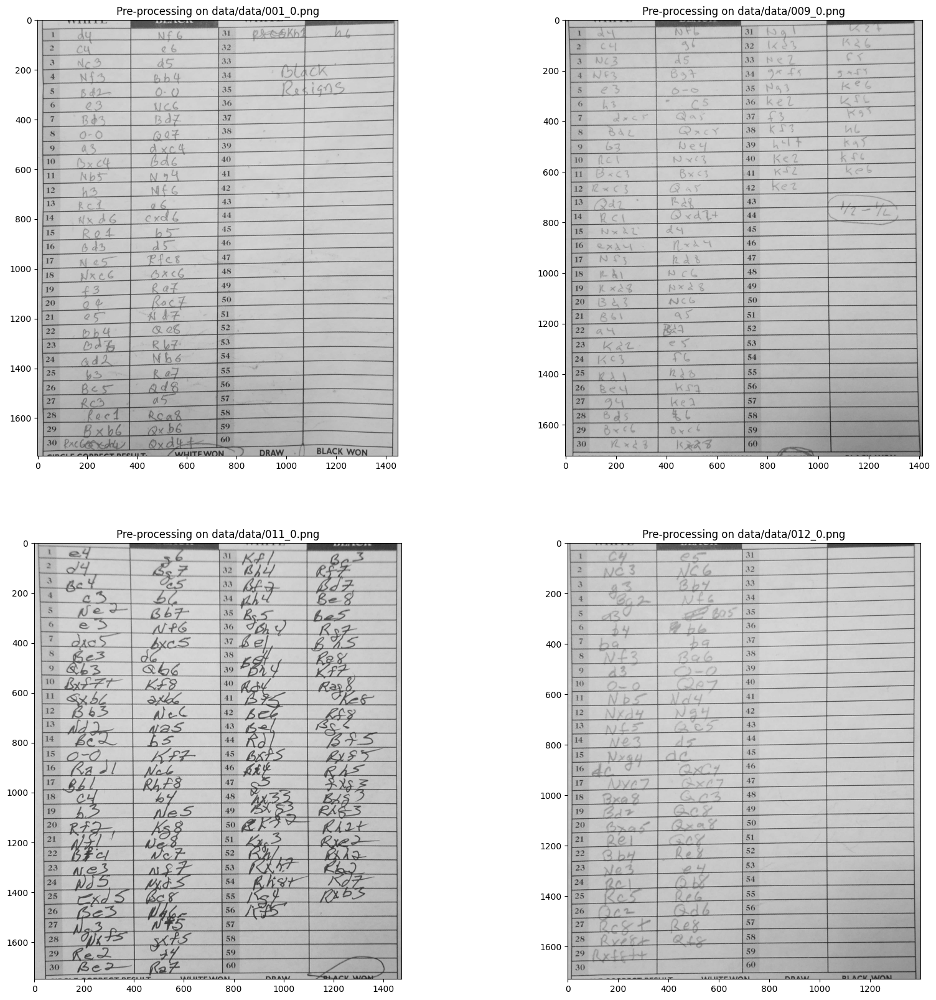

In [6]:
# Tiền xử lý dữ liệu đầu vào
# YOUR CODE HERE
def pre_process(img_gray):
    return cv2.cvtColor(img_gray, cv2.COLOR_GRAY2BGR)
    
# YOUR CODE HERE

# Minh hoạ kết quả thu được
def display_preprocess_results(img_paths):
    # Display
    fig, ax = plt.subplots(2, 2)
    fig.set_size_inches(20,20)
                        
    for i in range(len(img_paths)):
        img_color, img_gray = readImage(img_paths[i])
        img = pre_process(img_gray)
        
        (l, k) = divmod(i,2)
        ax[l, k].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax[l, k].title.set_text('Pre-processing on ' + img_paths[i])
            
    plt.show()  

# Hiển thị kết quả. Lưu ý: hình ảnh hiển thị dứoi đây chỉ là hình ảnh minh hoạ, 
# học viên cần đảm bảo thu được kết quả tốt nhất theo phương án của mình
display_preprocess_results(img_paths)

In [7]:
#


# 1. Cell detection

Phần này học viên thể hiện chiến thuật để phát hiện được các ô ghi điểm. Nếu có nhiều bước, học viên cần chỉ ra các kết quả trung gian quan trọng. Gợi ý: có thể dựa trên thông tin biên. Sấp xỉ các biên thành đa giác hoặc hình chữ nhật, và lọc những ô ko phù hợp

In [8]:
img_paths = ['data/data/001_0.png', 'data/data/009_0.png', 'data/data/011_0.png', 'data/data/012_0.png']

In [9]:
# blur number in table image

def blur_number_in_table(img_gray):

    img_blur = cv2.GaussianBlur(img_gray, (5, 5), 0)
    
    _, img_thresh = cv2.threshold(img_blur, 150, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    
    return img_thresh

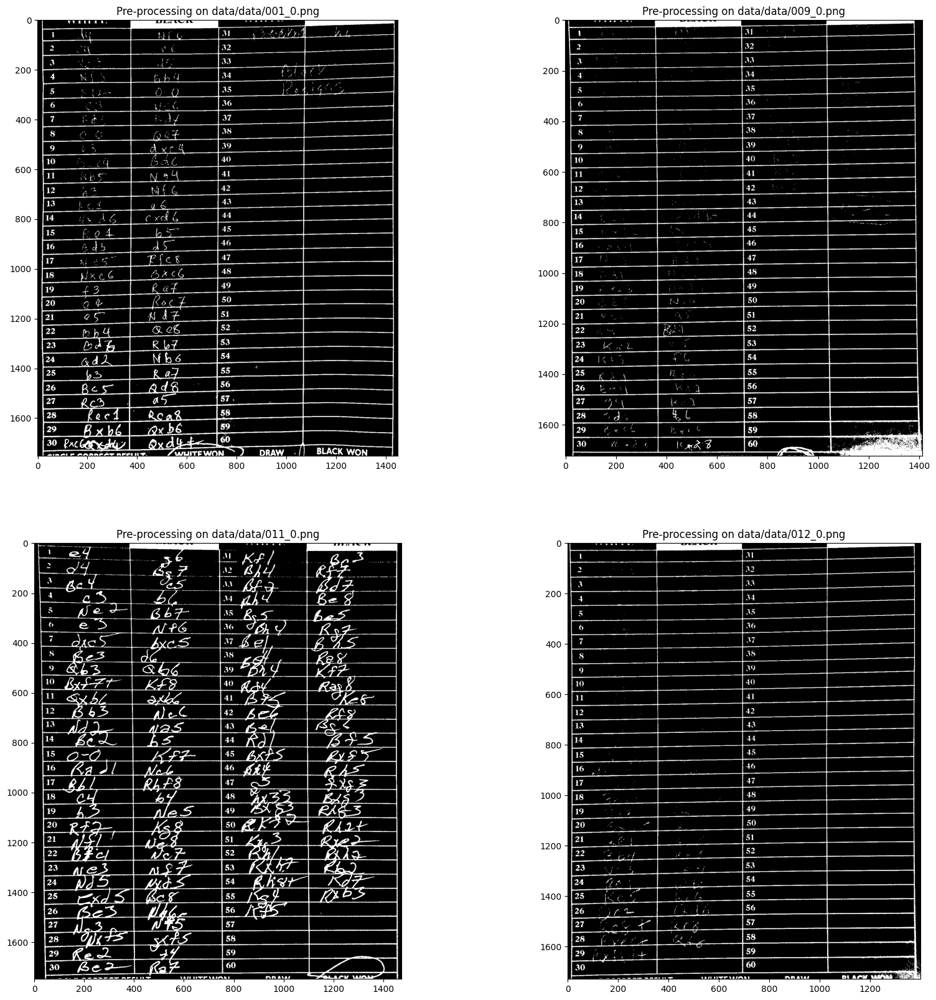

In [10]:
def readImage(img_path):
    img_color = cv2.imread(img_path)
    img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
    return img_color, img_gray

def pre_process(img_gray):
    # Apply GaussianBlur to reduce image noise and detail
    (threshold, img_bin) = cv2.threshold(img_gray, 128, 255, cv2.THRESH_BINARY|cv2.THRESH_OTSU)
    img_bin = cv2.bitwise_not(img_bin)
    # return img_blur
    return img_bin
    # return img_blur

def display_preprocess_results(img_paths):
    fig, ax = plt.subplots(2, 2)
    fig.set_size_inches(20,20)
    
    for i in range(len(img_paths)):
        img_color, img_gray = readImage(img_paths[i])
        img = pre_process(img_gray)
        
        (l, k) = divmod(i,2)
        ax[l, k].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax[l, k].title.set_text('Pre-processing on ' + img_paths[i])
        
    plt.show()

display_preprocess_results(img_paths)

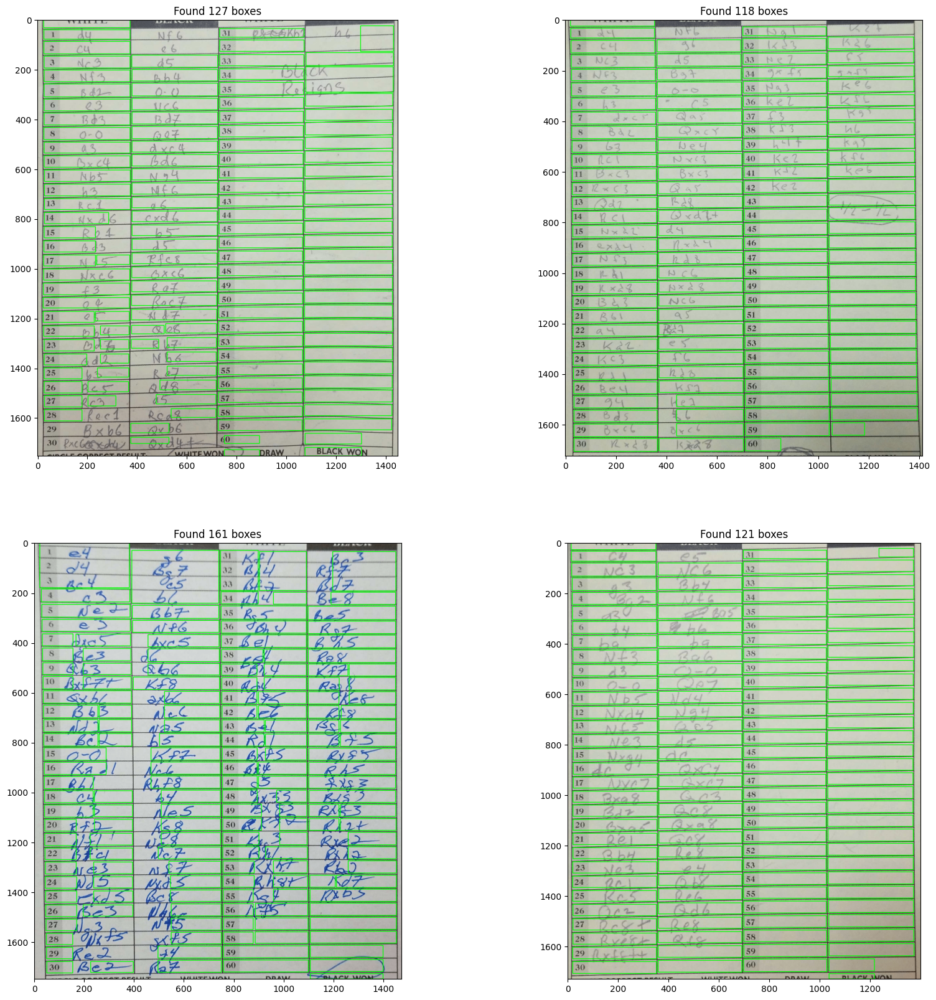

In [11]:
# YOUR CODE HERE
img_paths = ['data/data/001_0.png', 'data/data/009_0.png', 'data/data/011_0.png', 'data/data/012_0.png']
import cv2
import matplotlib.pyplot as plt

def readImage(img_path):
    img_color = cv2.imread(img_path)
    img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
    return img_color, img_gray

def table_detection(img_color, img_bin):


    kernel_length_v = (np.array(img_bin).shape[1])//120
    vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, kernel_length_v))
    im_temp1 = cv2.erode(img_bin, vertical_kernel, iterations=3)
    vertical_lines_img = cv2.dilate(im_temp1, vertical_kernel, iterations=20)

    kernel_length_h = (np.array(img_bin).shape[1])//40
    horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (kernel_length_h, 1))
    im_temp2 = cv2.erode(img_bin, horizontal_kernel, iterations=3)
    horizontal_lines_img = cv2.dilate(im_temp2, horizontal_kernel, iterations=20)

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    table_segment = cv2.addWeighted(vertical_lines_img, 0.5, horizontal_lines_img, 0.5, 0.0)
    table_segment = cv2.erode(cv2.bitwise_not(table_segment), kernel, iterations=2)
    thresh, table_segment = cv2.threshold(table_segment, 0, 255, cv2.THRESH_OTSU)

    contours, hierarchy = cv2.findContours(table_segment, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    count = 0

    boxes = []
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        if w > 100 and h > 20:
            boxes.append([x, y, w, h])

    img_rect = img_color.copy()
    for box in boxes:
        x, y, w, h = box
        cv2.rectangle(img_rect, (x, y), (x + w, y + h), (0, 255, 0), 2)

    return img_rect, len(boxes), boxes



def celldetection(img_color, img_gray):
    ret, img_gray = cv2.threshold(img_gray, 200, 255, 0)
    contours, _ = cv2.findContours(img_gray, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    boxes = []
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        if w > 400 and h > 100:
            boxes.append([x, y, w, h])

    img_rect = img_color.copy()
    for box in boxes:
        x, y, w, h = box
        cv2.rectangle(img_rect, (x, y), (x + w, y + h), (0, 255, 0), 2)

    return img_rect, len(boxes), boxes
    
    
# YOUR CODE HERE

# Minh hoạ kết quả thu được
def display_celldetection(img_paths):
    # Display
    fig, ax = plt.subplots(2, 2)
    fig.set_size_inches(20,20)
                        
    for i in range(len(img_paths)):
        img_color, img_gray = readImage(img_paths[i])

        # Pre-process
        img = pre_process(img_gray)
        
        # cell detection
        img_rect, number, boxes = table_detection(img_color, img)
        
        (l, k) = divmod(i,2)
        ax[l, k].imshow(cv2.cvtColor(img_rect, cv2.COLOR_BGR2RGB))
        ax[l, k].title.set_text('Found ' + str(number) + ' boxes')
    
    plt.show()  

# Hiển thị kết quả. Lưu ý: hình ảnh hiển thị dứoi đây chỉ là hình ảnh minh hoạ, 
# học viên cần đảm bảo thu được kết quả tốt nhất theo phương án của mình
#img_paths = ['../data/009_0.png', '../data/012_0.png']
display_celldetection(img_paths)

In [12]:
#
    

# 3. Locate cell position
Tìm chỉ số cho các ô đã được detect 

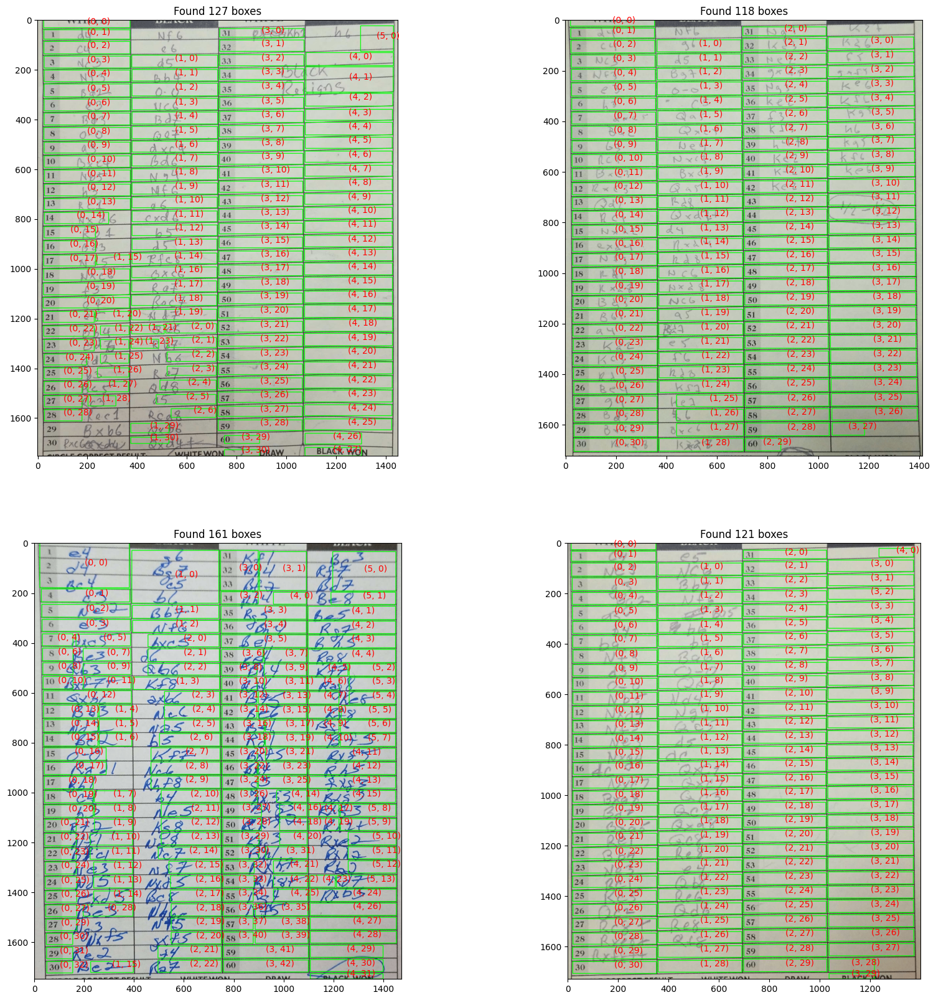

In [20]:
# YOUR CODE HERE
# def cellposition(boxes):
#     position_rect = []
#     centers_rect = []

#     boxes = sorted(boxes, key=lambda x: x[0])

#     i , j = 0, 0
#     cur_x = 0
#     cur_y = 0
#     grid = []
#     for idx, box in enumerate(boxes):
#         x, y, w, h = box        
#         if idx >0 and w*h > 5000:
#             if np.abs(boxes[idx][0] - boxes[idx - 1][0])<5:
#                 if x > cur_x + 200:
#                     i += 1
#                     j = 0
#                     cur_x = box[0]
#                 if y > cur_y + 200:
#                     j += 1
#                     cur_y = box[1]    
#                 position_rect.append((i, j))
#                 centers_rect.append((x + w // 2, y + h // 2))
#                 j += 1

    
    # return position_rect, centers_rect
# YOUR CODE HERE

def cellposition(boxes):
    
    position_rect = []
    centers_rect = []

    boxes = sorted(boxes, key=lambda x: x[0])
    row = []
    cur_x = 0
    i, j = 0, 0
    index = 0
    for box in boxes:
        x1, y1, w1, h1 = box
        if x1 > cur_x + 200:
            row = sorted(row, key=lambda x: x[1])
            for selected_box in row:
                x2, y2, w2, h2 = selected_box
                position_rect.append((i, j))
                centers_rect.append((x2 + w2 // 2, y2 + h2 // 2))
                index += 1
                j += 1
            i += 1
            j = 0
            cur_x = max(x1, cur_x)
            row = [box]
        else:
            row.append(box)

    row = sorted(row, key=lambda x: x[1])
    for selected_box in row:
        x2, y2, w2, h2 = selected_box
        position_rect.append((i, j))
        centers_rect.append((x2 + w2 // 2, y2 + h2 // 2))
        index += 1
        j += 1
        
    return position_rect, centers_rect


# Minh hoạ kết quả thu được
def display_cellposition(img_paths):
    # Display
    fig, ax = plt.subplots(2, 2)
    fig.set_size_inches(20,20)
                        
    for i in range(len(img_paths)):
        img_color, img_gray = readImage(img_paths[i])

        # Pre-process
        img = pre_process(img_gray)
        
        # cell detection
        img_rect, number, boxes = table_detection(img_color, img)

        # cell position
        position_rect, centers_rect = cellposition(boxes)
        
        (l, k) = divmod(i,2)
        
        ax[l, k].imshow(cv2.cvtColor(img_rect, cv2.COLOR_BGR2RGB))
        ax[l, k].title.set_text('Found ' + str(number) + ' boxes')
       
        for j in range(len(position_rect)):
            ax[l, k].text(centers_rect[j][0], centers_rect[j][1], str(position_rect[j]), color='red')
    
    plt.show()  

# Hiển thị kết quả. Lưu ý: hình ảnh hiển thị dứoi đây chỉ là hình ảnh minh hoạ, 
# học viên cần đảm bảo thu được kết quả tốt nhất theo phương án của mình
#img_paths = ['../data/009_0.png', '../data/012_0.png']
img_paths = ['data/data/001_0.png', 'data/data/009_0.png', 'data/data/011_0.png', 'data/data/012_0.png']
display_cellposition(img_paths)

In [14]:
#

In [15]:
img_paths = ['../Project1.4/001_0.png', '../Project1.4/009_0.png', '../Project1.4/011_0.png', '../Project1.4/012_0.png']
#img_paths = ['../Project1.4/001_0.png']
chessboardsheet_3(img_paths)

NameError: name 'chessboardsheet_3' is not defined